# Spatial Data in R

## An Introduction look at spatial analyses, plotting, manipulation and combination.

### **Introduction**

Spatial data can be represented using vector and raster data. vector data is used to display points, lines and polygons, and possibly associated information. Vector data may represent locations of monitoring stations, road networks, or municipalities of a country. Raster data are regular grids with cells of equal size that are used to store values of spatially continuous phenomena, such as elevation, temperature, precipitation, or air pollution values.

The `{sf}` and `{terra}` packages are the main packages that allow us to manipulate and analyze spatial data in R. In this section, we will make use of these packages, spatial data storage files, and coordinate reference systems to make astounding maps.

### **Data types**

When we talk about spatial data, the minimum requirements are generally having some form of spatial information (geometry or shape) and some additional information. This spatial information is normally an x and a y coordinate (may contain z and time in some cases).

#### Vector data

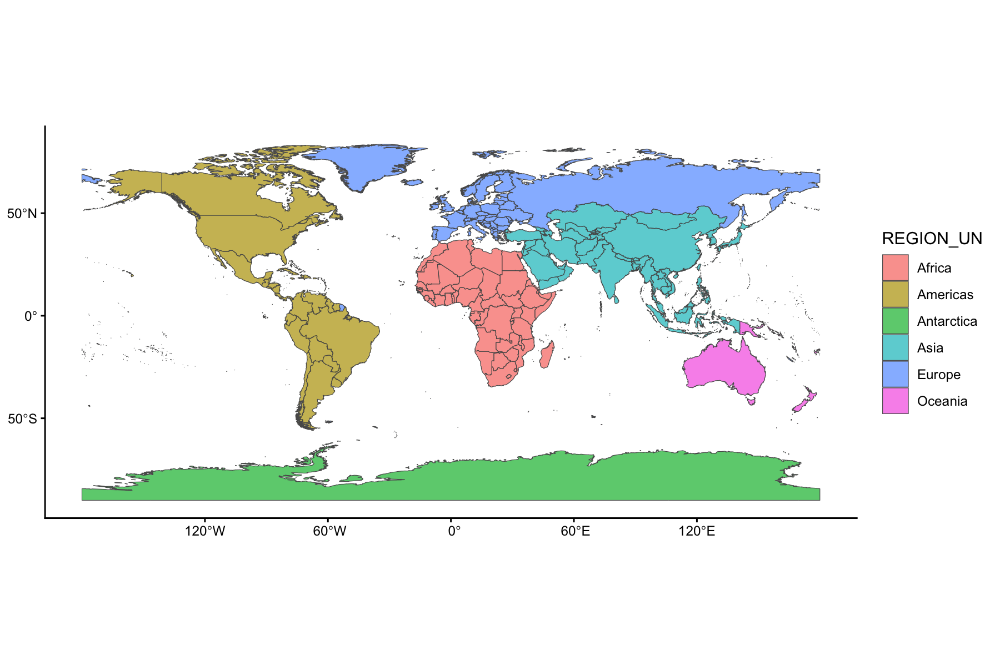

The most common types of spatial data are vectors. they are generally more discrete. The `{sf}` package allows us to work with vector data. vector data can have associated information such as temperature values measured at monitoring stations or number of people living in municipalities. Before the `{sf}` package was developed, the `{sp}` package, which is no longer maintained, was used to work with vector spatial data. 

#### Raster data

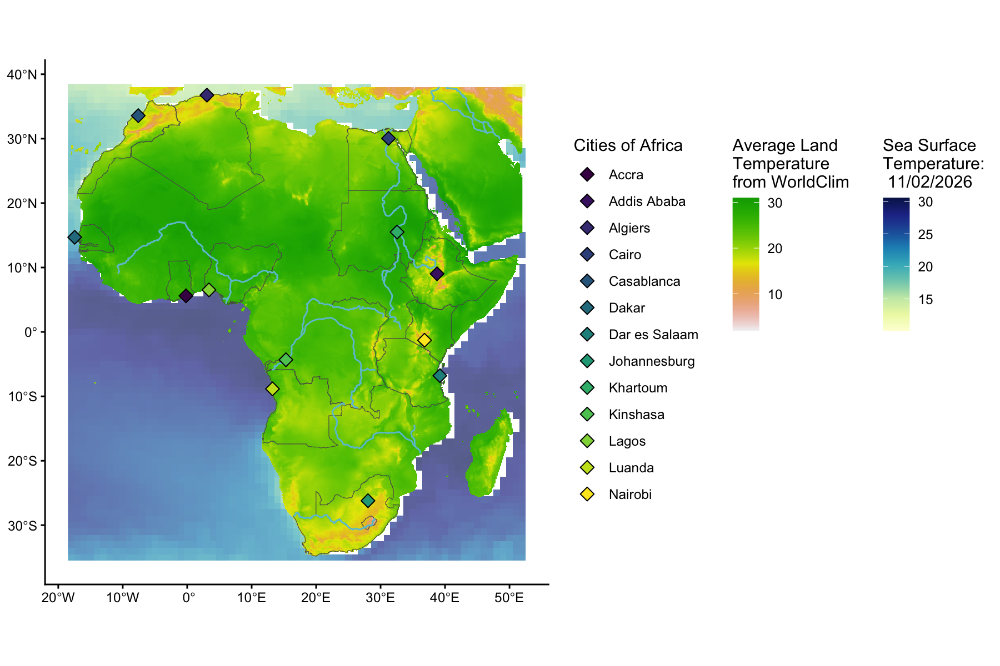

Another common spatial data type is raster data, which is more continuous spatially and is sometimes called spatial field or gridded data. raster data divides the region of study into rectanles of the same size called cells or pixels, and that can store one or more values for each of these cells. For example, bathymetry or elevation of an area will be a grid of x and y spatial cells with a bathymetry or elevation value for each cell of the grid. 

In R, `{terra}` is the main package to work with raster data, which also has functionality to work with vector data. Before `{terra}` was developed, the `{raster}` package was used to analyze raster data. `{terra}` is very similar to `{raster}` but can do more and is faster. The `{stars}` package can also be used to analyze raster data as well as spatial data cubes which are arrays with one or more spatial dimensions.

### **Mapping with vector data**
#### Create vector data

we can combine various data types to make displays of our data. But also, we can combine the data types above to perform more complex manipulations or analyses. Let us bring in some vector data with the `{sf}` package. The `{sf}` package allows us to bring in our vector data easily and inspect, manipulate and plot it in a very similar way to using a normal dataframe. The only difference is that we have a column called **geometry** that stores the spatial data for each row.

We can create the first data type, **point data**, ourselves in R, without having to read any data in. First we make a dataframe with the information of each point (latitude, longitude, name), then we use `{sf}` to convert this df to an **sf object**. Telling `{sf}` which columns are our geomtry info and what coordinate reference system we are working in. 

```
The coordinates of these areas were copied and pasted from google.
```

In [1]:
options(
  repr.plot.width  = 9,
  repr.plot.height = 6,
  repr.plot.res    = 200
)

# These options center our plots and gives them a better resolution than default.

In [3]:
# install.packages("geojsonio")
library(tidyverse)
library(sf)

In [4]:
Points_df <- data.frame(
  City = c(
    "Cairo", "Lagos", "Nairobi", 
    "Johannesburg", "Addis Ababa", "Casablanca", 
    "Accra", "Kinshasa", "Dar es Salaam", 
    "Algiers", "Luanda", "Dakar",
    "Khartoum"
  ),   
  Long = c(31.2357, 3.3792, 36.8219, 28.0473, 
          38.7578, -7.5898, -0.1870, 15.3139, 
          39.2026, 3.0588, 13.2344, -17.4467, 32.5599),                         
  Lat = c(30.0444, 6.5244, -1.2921, -26.2041, 
         9.0250, 33.5731, 5.6037, -4.3224, 
         -6.7924, 36.7538, -8.8390, 14.6928, 15.5007)
)  

head(Points_df)

,City,Long,Lat
,<chr>,<dbl>,<dbl>
1,Cairo,31.2357,30.0444
2,Lagos,3.3792,6.5244
3,Nairobi,36.8219,-1.2921
4,Johannesburg,28.0473,-26.2041
5,Addis Ababa,38.7578,9.0250
6,Casablanca,-7.5898,33.5731


In [5]:
# Convert to simple features (sf) object
Points_sf <- Points_df %>% 
  st_as_sf(coords = c("Long", "Lat")) %>% 
  st_set_crs("EPSG:4326") 

head(Points_sf)

Registered S3 method overwritten by 'geojsonsf':
  method        from   
  print.geojson geojson



,City,geometry
,<chr>,<POINT [°]>
1,Cairo,POINT (31.2357 30.0444)
2,Lagos,POINT (3.3792 6.5244)
3,Nairobi,POINT (36.8219 -1.2921)
4,Johannesburg,POINT (28.0473 -26.2041)
5,Addis Ababa,POINT (38.7578 9.025)
6,Casablanca,POINT (-7.5898 33.5731)


We can see that when we inspect the **sf object** it has more spatial information that `{sf}` has assigned to the df when converting. R recognises an **sf object** as being spatial, now we can use the base plot function to look at the point locations. This isn’t an amazing plot as there is not much information in the **sf object**, just city names.

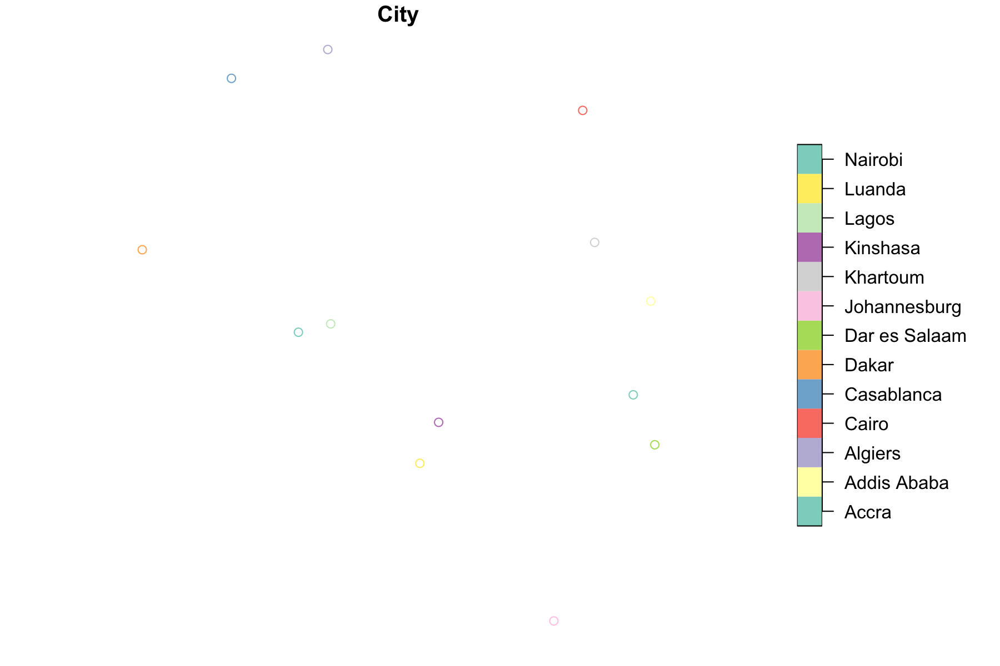

In [6]:
plot(Points_sf)

As it acts just like any other dataframe we can add data, subset, manipulate and join in the same way we would with `{tidyverse}`.

### Open Access vector data

we can perform analyses between different spatial objects. If we can get spatial information for boundaries of countries in the world, we can use our cities to join and subset the dataset. We will use the naturalhires suite of packages to get polygons of the world boundaries. let us bring the data using a 10 metre resolution and convert it to an **sf object** .

In [8]:
library(rnaturalearth) 
library(rnaturalearthdata) 
#remotes::install_github("ropensci/rnaturalearthhires")
library(rnaturalearthhires) 

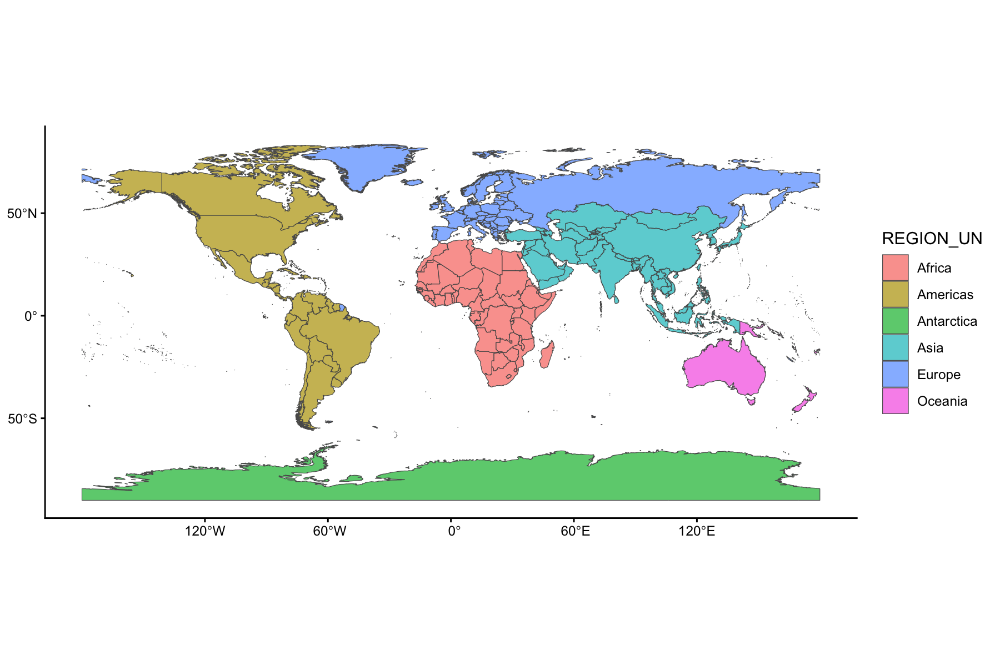

In [9]:
world_map <- sovereignty10 %>% 
  st_as_sf() 

ggplot(world_map)+
  geom_sf(aes(fill = REGION_UN),alpha = 0.7)+
  theme_classic()

We can inspect the information attached to each row in the sf file for each country. But I will select some specific columns of interest to neaten the dataset up first.

In [10]:
world_map <- world_map %>% 
  select(SOVEREIGNT, ADM0_A3, CONTINENT,
         REGION_UN, SUBREGION, POP_EST,
         POP_RANK, POP_YEAR, GDP_MD, GDP_YEAR)

head(world_map)

,SOVEREIGNT,ADM0_A3,CONTINENT,REGION_UN,SUBREGION,POP_EST,POP_RANK,POP_YEAR,GDP_MD,GDP_YEAR,geometry
,<chr>,<chr>,<chr>,<chr>,<chr>,<dbl>,<int>,<int>,<int>,<int>,<MULTIPOLYGON [°]>
1,Indonesia,IDN,Asia,Asia,South-Eastern Asia,270625568,17,2019,1119190,2019,MULTIPOLYGON (((117.7036 4....
2,Malaysia,MYS,Asia,Asia,South-Eastern Asia,31949777,15,2019,364681,2019,MULTIPOLYGON (((117.7036 4....
3,Chile,CHL,South America,Americas,South America,18952038,14,2019,282318,2019,MULTIPOLYGON (((-69.51009 -...
4,Bolivia,BOL,South America,Americas,South America,11513100,14,2019,40895,2019,MULTIPOLYGON (((-69.51009 -...
5,Peru,PER,South America,Americas,South America,32510453,15,2019,226848,2019,MULTIPOLYGON (((-69.51009 -...
6,Argentina,ARG,South America,Americas,South America,44938712,15,2019,445445,2019,MULTIPOLYGON (((-67.1939 -2...


If we plot our cities on top of the countries we can see it is only a select few cities that we have. Maybe we want to extract only the polygons that one of our cities lands inside of spatially?

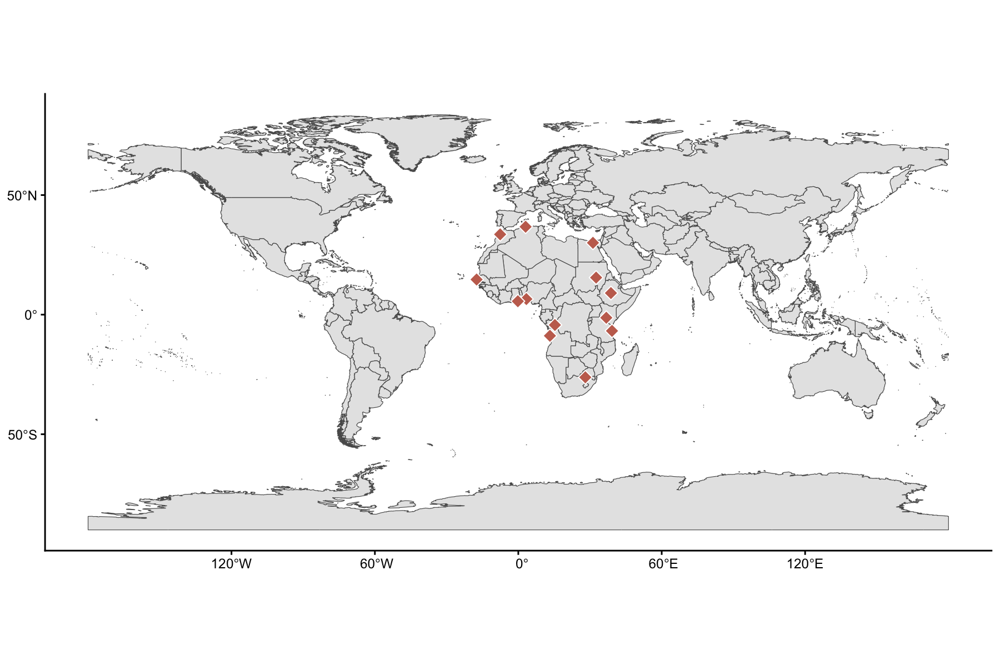

In [11]:
ggplot(world_map)+
  geom_sf()+
  geom_sf(data = Points_sf, fill= "#C56E5D", colour = "white", shape = 23, size = 3)+
  theme_classic()

We can use a join to combine the **sf objects**. To carry out spatial joins we need to tell `{sf}` that we want to work in 2D space (not a true sphere).

In [12]:
sf_use_s2(FALSE)

Spherical geometry (s2) switched off



In [13]:
Africa <- world_map %>% 
  st_join(Points_sf,left = F)

although coordinates are longitude/latitude, st_intersects assumes that they
are planar



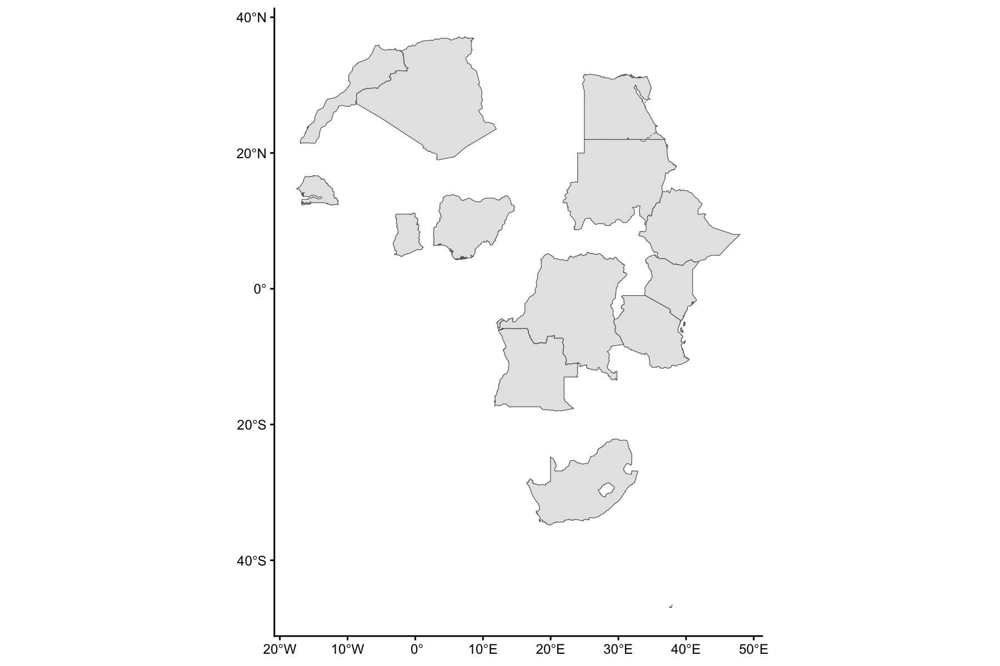

In [14]:
ggplot(Africa)+
  geom_sf()+
  theme_classic()

This looks a bit weird, we seem to have gained oceanic islands too, also, some countries such as Guinea, Mozambique, Swaziland and The Gambia were omitted from the map due to possible coordinate mismatches with their capitals. However we will move, it does not matter much. I will however clip out the far Eastern and Western oceanic islands.

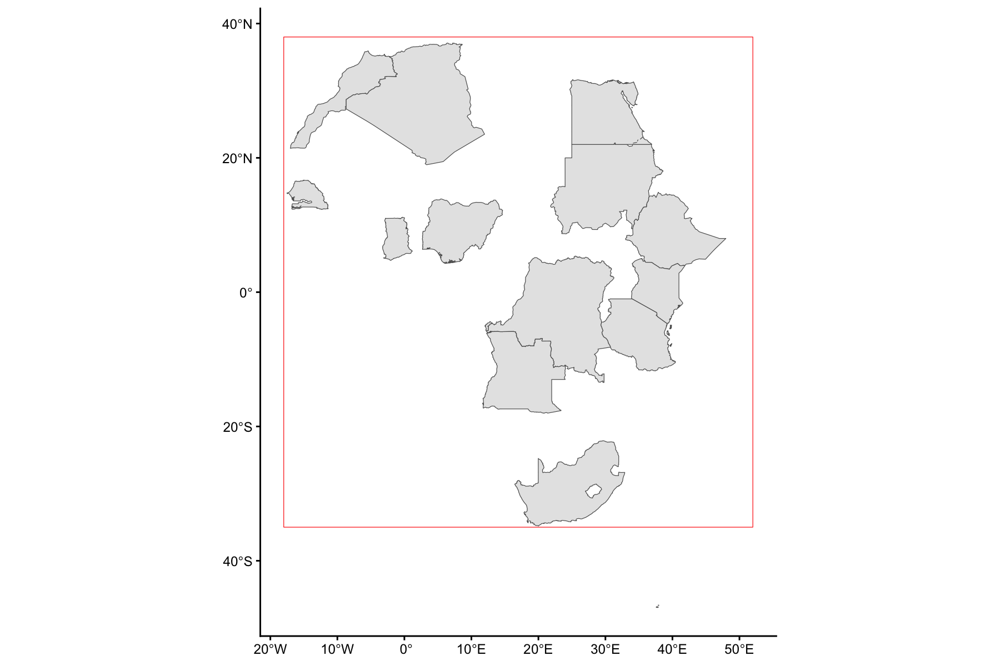

In [15]:
# Create boundingbox of Africa for clippings

ylims <- c(-35, 38)

xlims <- c(-18, 52)

box_coords <- tibble(x = xlims, y = ylims) %>% 
  st_as_sf(coords = c("x", "y"),crs="EPSG:4326") %>%
  st_bbox() %>% 
  st_as_sfc()


ggplot(Africa)+
  geom_sf()+
  geom_sf(data = box_coords, colour = "red", fill = NA)+
  theme_classic()

I am happy with the bounding box, we will subset it for now.

In [16]:
Africa_subset <- st_intersection(Africa, box_coords)

although coordinates are longitude/latitude, st_intersection assumes that they
are planar

Warning message:
“attribute variables are assumed to be spatially constant throughout all geometries”


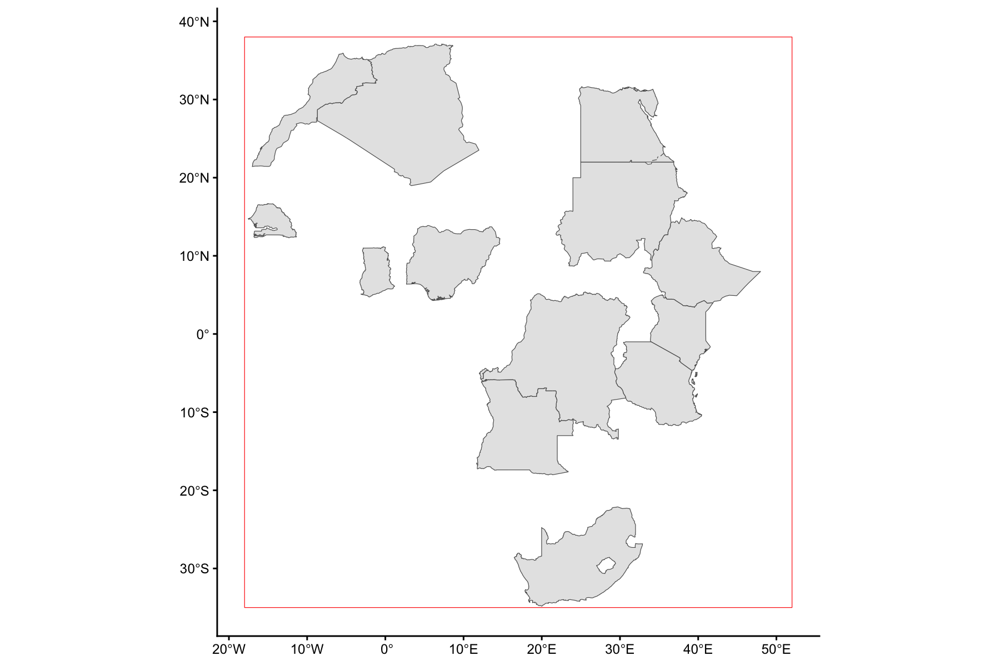

In [17]:
ggplot(Africa_subset)+
  geom_sf()+
  geom_sf(data = box_coords, colour = "red", fill = NA)+
  theme_classic()

### Load local vector data

We will get some Vector Data and load it into R from our local system. I downloaded river shape file from: https://datacatalog.worldbank.org/search/dataset/0042032/Major-Rivers-of-the-World

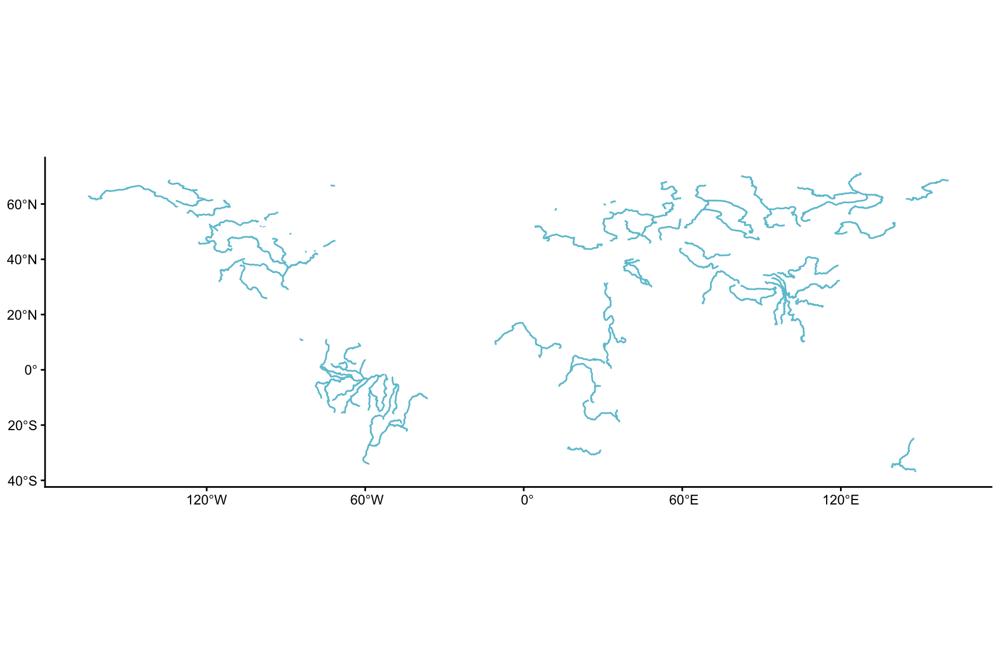

In [18]:
Rivers <- st_read("Data/majorrivers_0_0/MajorRivers.shp", quiet = T) 

ggplot(Rivers)+
  geom_sf(colour = "#6cc3d5")+
  theme_classic()

This looks to be correct, so lets do as before and select the rivers that are in Africa. We could select the Nile by using dplyr::filter(SYSEM==“Nile”) but lets reuse our bounding box from earlier to select all rivers in Africa.

In [19]:
Africa_rivers <- st_intersection(Rivers, box_coords)

although coordinates are longitude/latitude, st_intersection assumes that they
are planar

Warning message:
“attribute variables are assumed to be spatially constant throughout all geometries”


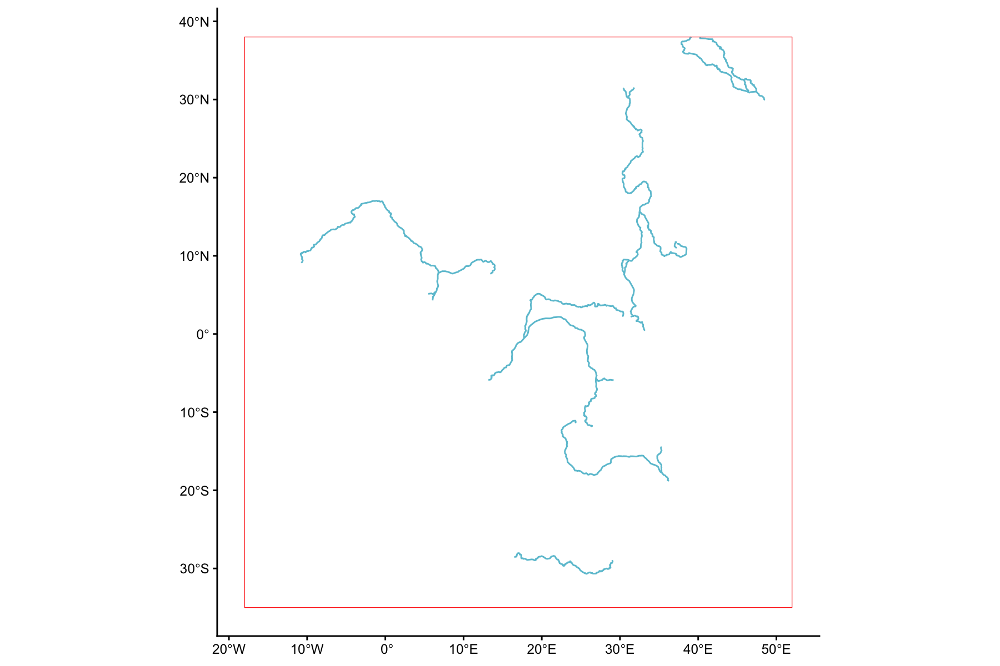

In [20]:
ggplot(Africa_rivers)+
  geom_sf(colour = "#6cc3d5")+
  geom_sf(data = box_coords, colour = "red", fill = NA)+
  theme_classic()

There are extra bits of information in this sf that we can treat just like a normal df. How long are all the rivers in Africa? (In this shape file that is)

In [21]:
sum(Africa_rivers$KILOMETERS)

[1] 33935.95

Which is the maximum?

In [22]:
Africa_rivers %>%
             filter(KILOMETERS == max(KILOMETERS))

,NAME,SYSTEM,MILES,KILOMETERS,geometry
,<chr>,<chr>,<dbl>,<dbl>,<MULTILINESTRING [°]>
1,White Nile,Nile,3157.753,5081.921,MULTILINESTRING ((32.48513 ...


Shocking, it's the Nile!

Lets combine all these Vector data into a single plot.

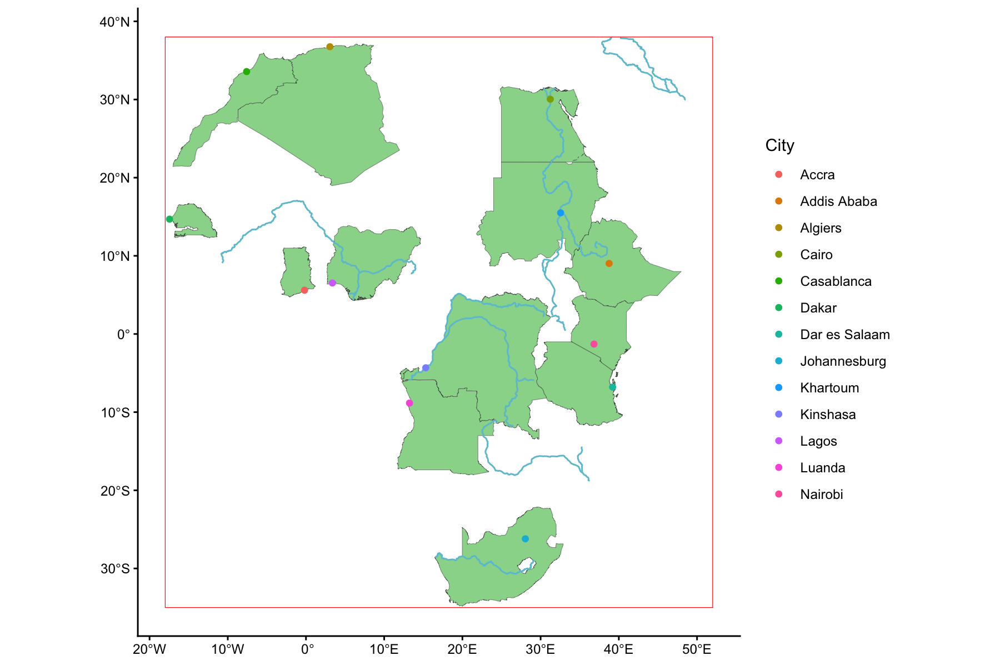

In [23]:
ggplot(Africa_subset)+
  geom_sf(linewidth = 0.1, alpha = 0.8,
          fill = "palegreen3", colour = "grey30")+
  geom_sf(data = Africa_rivers, colour = "#6cc3d5")+
  geom_sf(data = Points_sf, aes(colour = City))+
  geom_sf(data = box_coords, colour = "red", fill = NA)+
  theme_classic()

There are some rivers present in the middle-east which snuck into our bounding box, as well as the ocean islands. I do not mind their presence there however if it is something that bothers you, you can clip them out.

### Mapping with raster data
#### Create raster data

Just like with all data forms in R (see vector data above), we can create our own version of raster data. The most important information for raster data is the dimensions (x, y, z, etc.), the resolution (how big each pixel is) and its extent (where it is in space). We can make a random noise raster, then inspect it by plotting it. Rasters in R generally are well plotted by the base `plot()` function. But we can also use the `{tidyterra}` package, which adds a new geom_* to `ggplot()`.

In [25]:
# install.packages("tidyterra")
library(terra)
library(tidyterra)

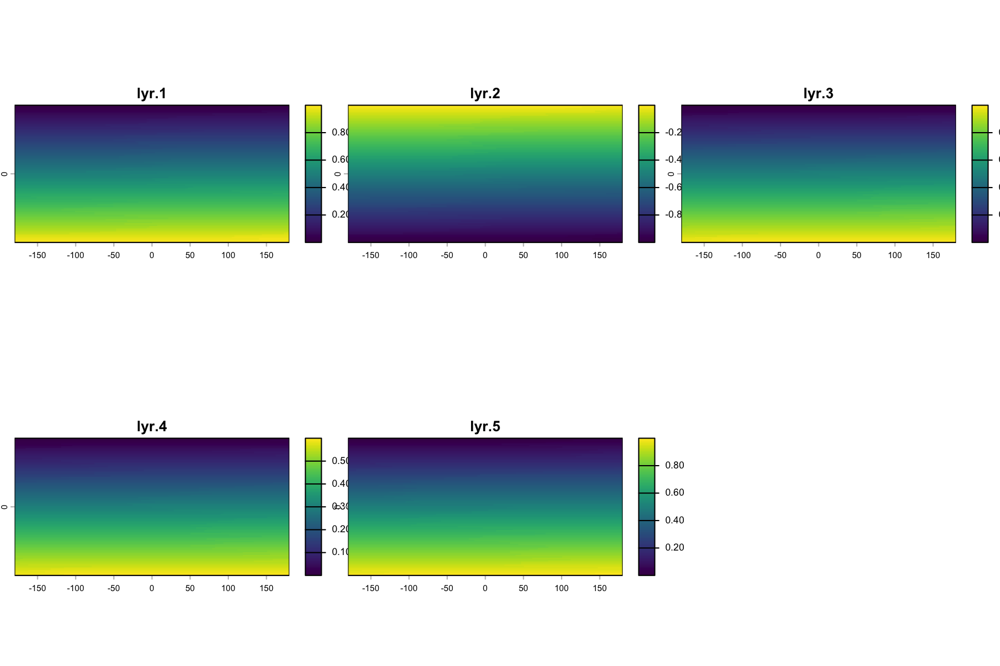

In [26]:
r <- rast(ncol = 100, nrow = 100, nlyrs = 5)

values(r[[1]]) <- sort(runif(1:ncell(r)))

values(r[[2]]) <- values(r[[1]])*-1

values(r[[3]]) <- sort(runif(1:ncell(r)))

values(r[[4]]) <- values(r[[3]])*0.6

values(r[[5]]) <- sort(runif(1:ncell(r)))

plot(r)

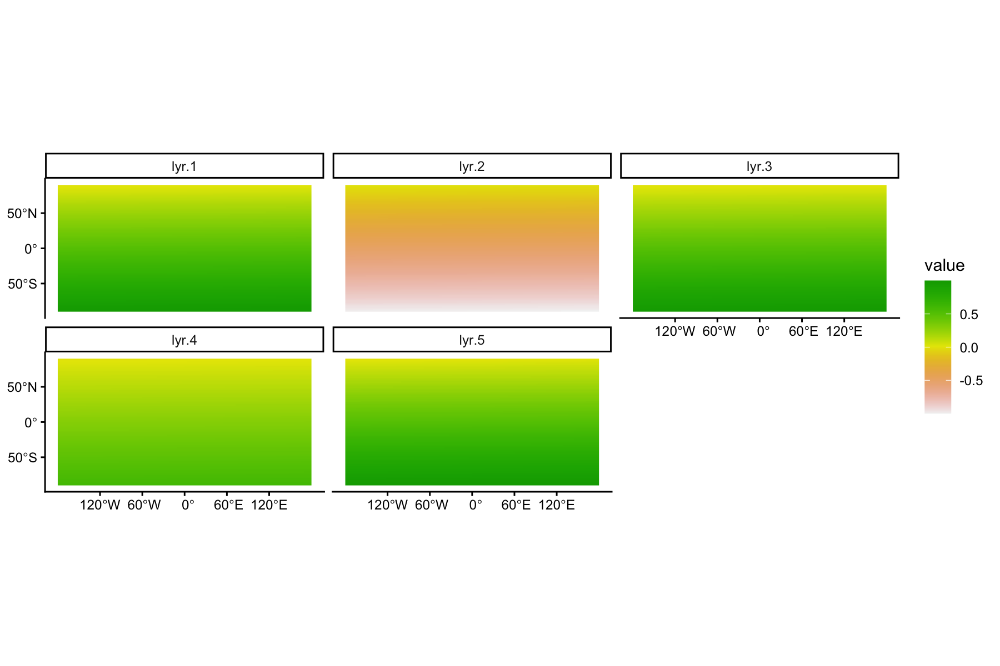

In [27]:
ggplot()+
  geom_spatraster(data = r)+
  facet_wrap(~lyr)+
  scale_fill_terrain_c()+
  theme_classic()

So far we haven’t added any information about where this raster is. We can inspect it to find what are its dimensions, resolution and extent.

In [28]:
dim(r)

[1] 100 100   5

In [29]:
res(r)

[1] 3.6 1.8

In [30]:
ext(r)

SpatExtent : -180, 180, -90, 90 (xmin, xmax, ymin, ymax)

We can see that this raster has 100 rows, 100 columns and 5 layers. Layers are a bit more complicated but they are often visualised with each layer being laid ontop of the other spatially but some containing different information. It also has a resolution of 3.6 by 1.8 per pixel. And we can see what this information means in relation to its extent. Which is -180 to 180 and -90 to 90, which are the default before we tell raster where the raster is located in space. Once we change the extent we can see that our resolution changes too.

In [31]:
ext(r)<-c(0,100,0,100)

res(r)

[1] 1 1

In [32]:
ext(r)<-c(0,50,0,50)

res(r)

[1] 0.5 0.5

As we see the difference in extent is divided by the dimension to give the resolution. If we don’t pay attention to this we can get some weird results when changing dimension, resolution or extent.

### Open access raster data

Let us take a look at real world raster data

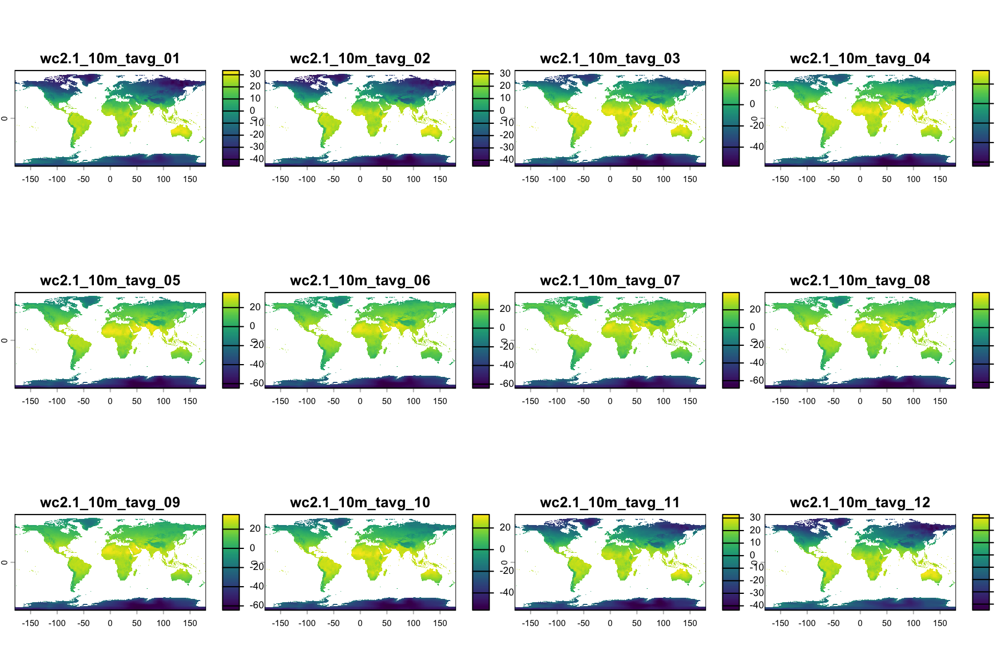

In [33]:
library(geodata)

avgtemp <- worldclim_global(var = "tavg", res = 10, path = tempdir())

plot(avgtemp)

In [34]:
res(avgtemp)

[1] 0.1666667 0.1666667

In [35]:
dim(avgtemp)

[1] 1080 2160   12

In [36]:
ext(avgtemp)

SpatExtent : -180, 180, -90, 90 (xmin, xmax, ymin, ymax)

This is a big dataset and global, so lets subset it spatially. We can use our bounding box from earlier to do this but first lets convert our **sf object** to a **spatvector object**. **spatvector** and **sf objects** are very similar, but **spatvector** plays a bit nicer with **spatrasters**, whereas **sf objects** are generally easier to manipulate and analyse using our well practiced `{dplyr}` and `{tidyr}` skills.

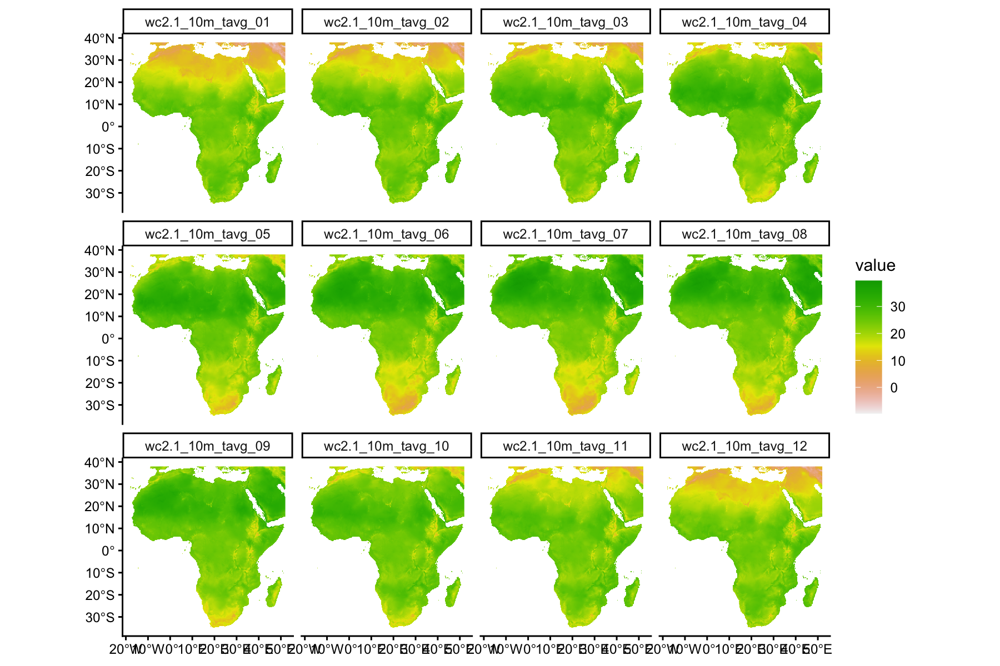

In [37]:
Box_terra <- vect(box_coords)

avgtemp_Africa <- avgtemp %>% 
  crop(Box_terra)

ggplot()+
  geom_spatraster(data = avgtemp_Africa)+
  facet_wrap(~lyr)+
  scale_fill_terrain_c()+
  theme_classic()

Okay, we have data for every month, this is interesting but a lot to deal with. Lets take the mean across all layers. We could also resample to make computation faster but the raster will become more pixelated.

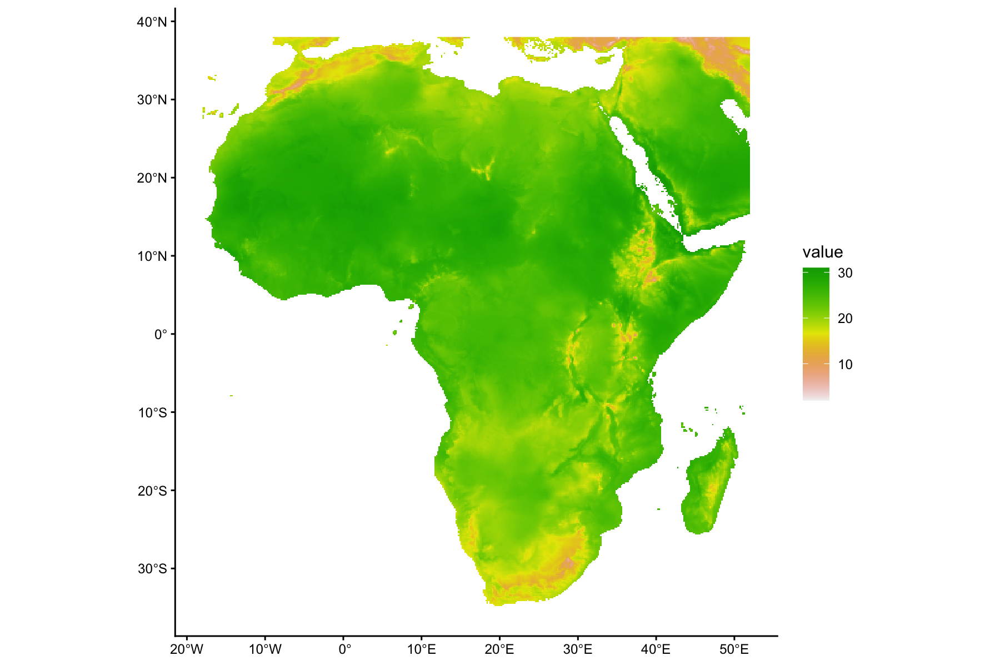

In [38]:
avgtemp_Africa_mean <- avgtemp_Africa %>% 
  mean()

ggplot()+
  geom_spatraster(data = avgtemp_Africa_mean)+
  scale_fill_terrain_c()+
  theme_classic()

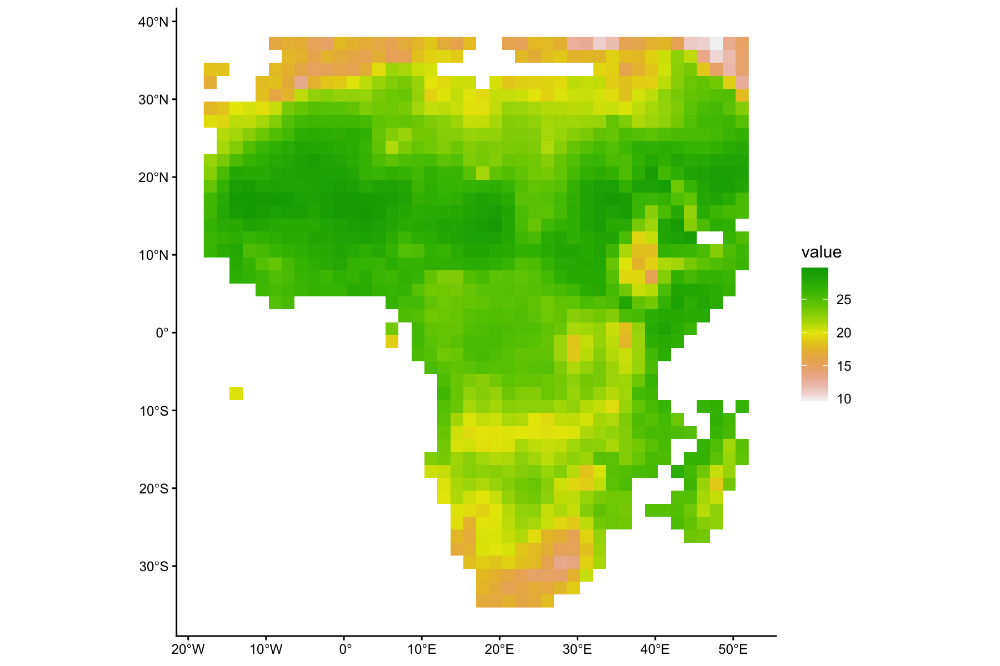

In [39]:
avgtemp_Africa_mean_agg <- avgtemp_Africa_mean %>% 
  terra::aggregate(fact = 10, fun = "mean", na.rm = T)

ggplot()+
  geom_spatraster(data = avgtemp_Africa_mean_agg)+
  scale_fill_terrain_c()+
  theme_classic()

Okay, lets use this climate data to look at the average temperatures (across the whole year) in our shape file of countries. Lets try two methods, take the centroid of each country then extract the average temperature for that location or we can take the average values within each country then average across its extent.

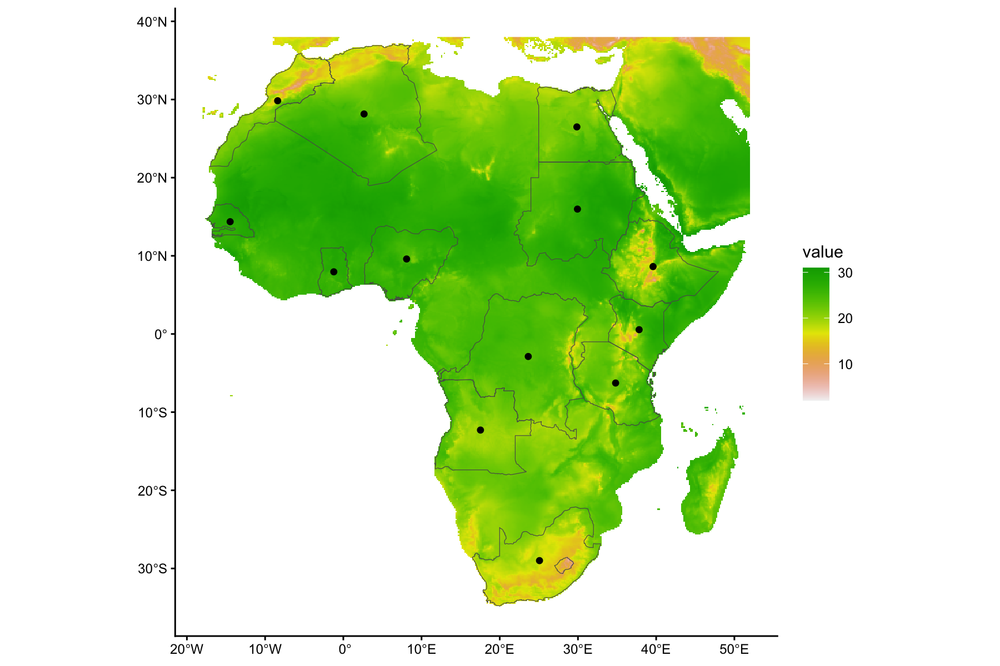

In [40]:
countries_vect <- vect(Africa_subset)

centroids_Africa <- countries_vect %>% 
  centroids() 

ggplot()+
  geom_spatraster(data = avgtemp_Africa_mean)+
  geom_spatvector(data = countries_vect,fill=NA)+
  geom_spatvector(data = centroids_Africa)+  
  scale_fill_terrain_c()+
  theme_classic()

In [41]:
Centroid_temps <- avgtemp_Africa_mean %>% 
  extract(centroids_Africa) %>% 
  rename(Centroid = mean) 

Country_temps <- avgtemp_Africa_mean %>% 
  extract(countries_vect,mean)%>% 
  rename(Extract = mean)

We can compare these different methods for finding a countries average temperature.

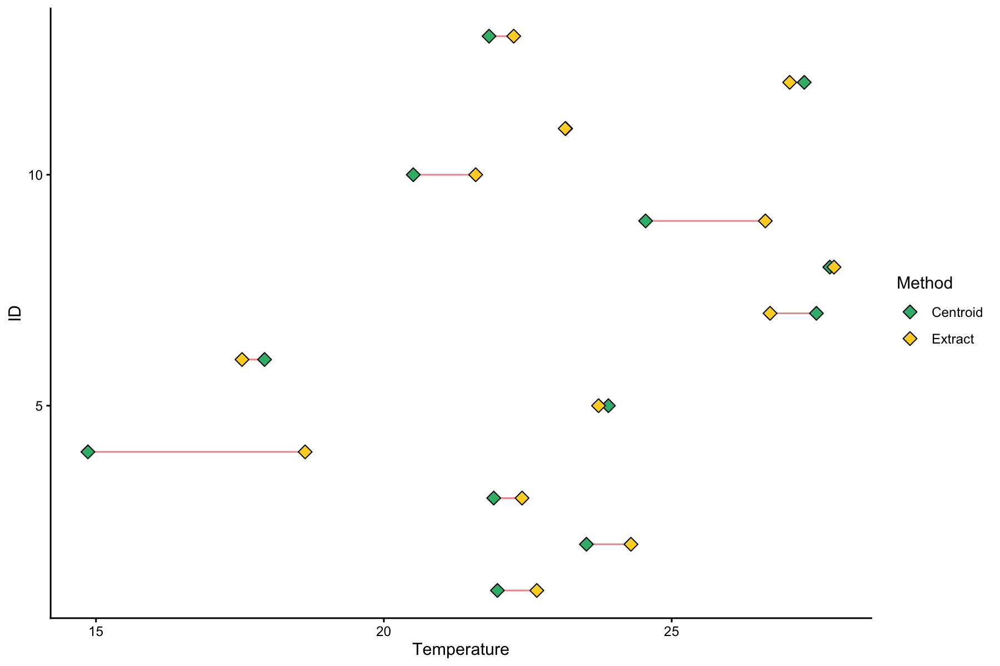

In [42]:
Temps <- Centroid_temps %>% 
  full_join(Country_temps, by = "ID") %>% 
  pivot_longer(-ID, names_to = "Method", values_to = "Temp")

Temps_Segment <- Centroid_temps %>% 
  full_join(Country_temps, by = "ID") 

ggplot(Temps)+
  geom_segment(data = Temps_Segment,aes(x = ID, xend = ID, 
                                     y = Extract, yend = Centroid),
               colour = "#f3969a")+
  geom_point(aes(x = ID, y = Temp, fill = Method), size = 3, shape = 23)+
  scale_fill_manual(name = "Method", values = c("#36b779", "#fcd32c"))+
  labs(y = "Temperature")+
  theme_classic()+
  coord_flip()

We can see some countries with little variation between the centroid and the overall mean. But some countries have a big difference. Obviously, we could do this in a multitude of different ways and it would depend on the objective that we had.

### Local raster data

Now lets load in some local raster data and maybe we can combine all of the above methods together. I went to this website and downloaded a raster of Sea Surface Temperature from 20260211: https://www.cpc.ncep.noaa.gov/products/GIS/GIS_DATA/sst_oiv2/index.php

In [43]:
SST <- rast("Data/sst_io.latest.tif/sst_io.20260211.tif")

SST

class       : SpatRaster 
size        : 181, 361, 1  (nrow, ncol, nlyr)
resolution  : 1, 1  (x, y)
extent      : -0.5, 360.5, -90.5, 90.5  (xmin, xmax, ymin, ymax)
coord. ref. : lon/lat WGS 84 (EPSG:4326) 
source      : sst_io.20260211.tif 
name        : sst_io.20260211 

In [44]:
summary(SST)

Warning message:
“[is.lonlat] coordinates are out of range for lon/lat”


 sst_io.20260211   
 Min.   :-999.000  
 1st Qu.:-999.000  
 Median :   1.677  
 Mean   :-325.945  
 3rd Qu.:  22.274  
 Max.   :  31.152  

By inspecting the `.tif` we can see there are some odd values (-999). This is likely to be a NA value so we should set them as NA. Also, the longitude is 0-360 rather than -180-180. This creates a pacific centric view, but we need to change this so we can extract the values we want.

In [45]:
NAflag(SST) <- c(-999)

summary(SST)

Warning message:
“[is.lonlat] coordinates are out of range for lon/lat”


 sst_io.20260211 
 Min.   :-1.800  
 1st Qu.: 1.777  
 Median :15.460  
 Mean   :14.134  
 3rd Qu.:25.913  
 Max.   :31.152  
 NA's   :21933   

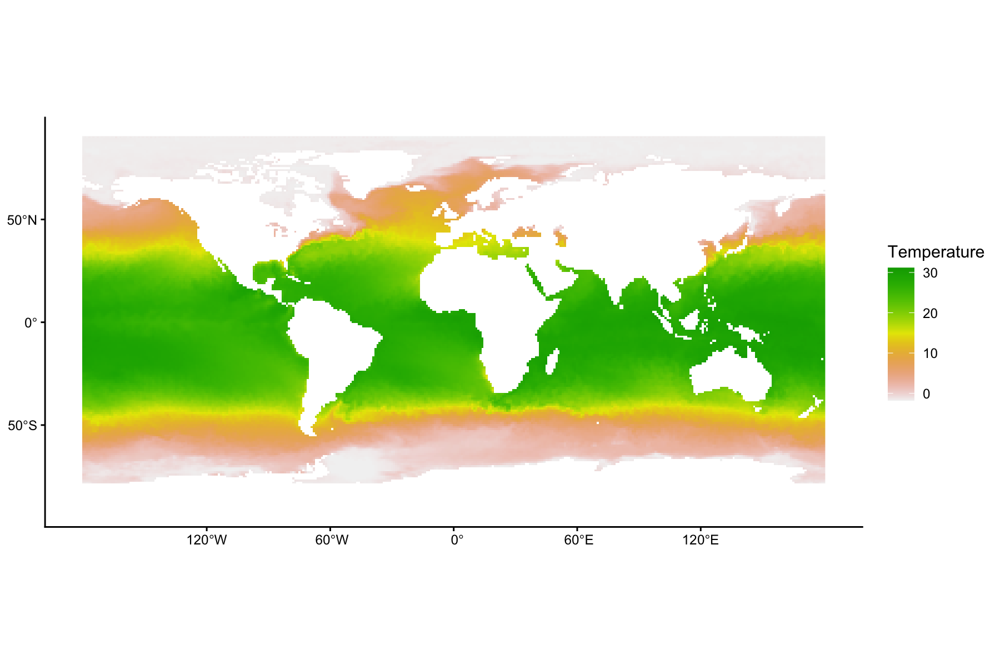

In [46]:
SST_Atlantic <- rotate(SST)

ggplot()+
  geom_spatraster(data = SST_Atlantic)+
  scale_fill_terrain_c()+
  labs(fill = "Temperature")+
  theme_classic()

Again lets crop this to just Africa.

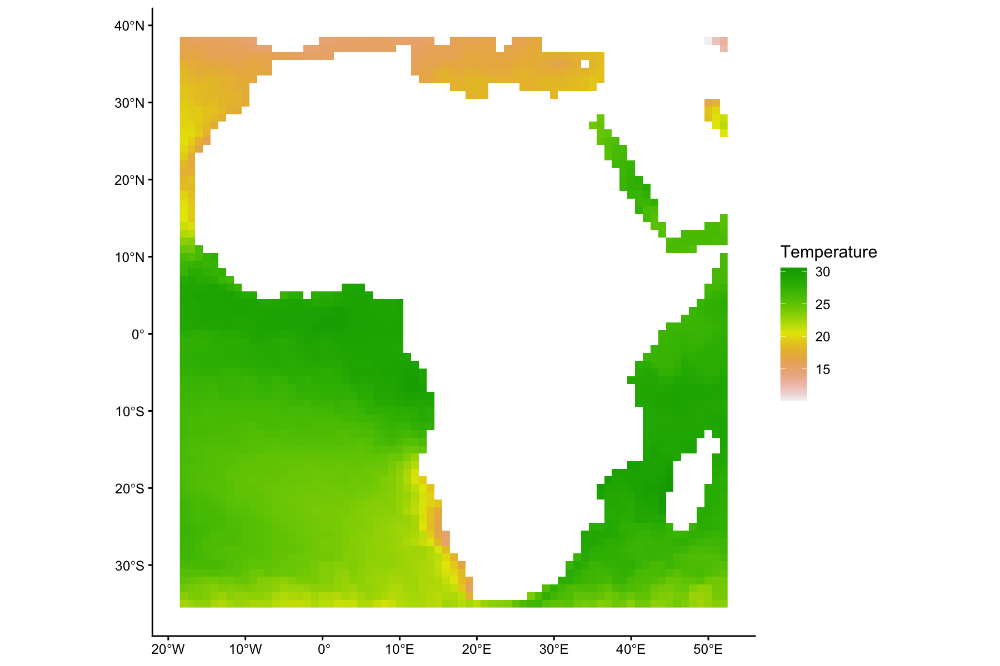

In [47]:
SST_Africa <- SST_Atlantic %>% 
  crop(Box_terra)

ggplot()+
  geom_spatraster(data = SST_Africa)+
  scale_fill_terrain_c()+
  labs(fill = "Temperature")+
  theme_classic()

This looks good, now lets bring together all the things we have been looking at to create one map of Africa. (all the temperatures are different ranges so don’t read too much into any of it!!!). We will be using multiple scales for the same aesthetic (fill) in this so we will use the `{ggnewscale}` package to reset scales.

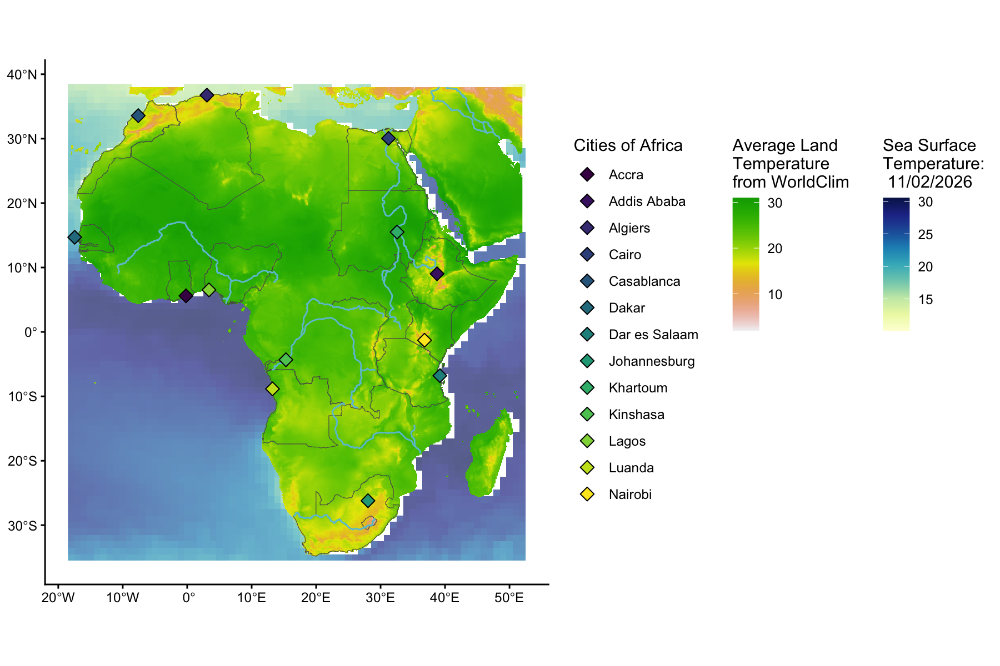

In [57]:
# install.packages("ggnewscale")
library(ggnewscale)

ggplot()+
  geom_spatraster(data = SST_Africa, alpha = 0.7)+
  scale_fill_whitebox_c("deep", name = "Sea Surface\nTemperature:\n 11/02/2026")+
  new_scale_fill()+
  geom_spatraster(data = avgtemp_Africa_mean)+
  geom_spatvector(data = countries_vect, fill = NA)+
  scale_fill_terrain_c(name="Average Land\nTemperature\nfrom WorldClim")+
  new_scale_fill()+
  geom_sf(data = Africa_rivers, colour = "#6cc3d5")+
  geom_sf(data = Points_sf, aes(fill = City), shape = 23, size = 3)+
  scale_fill_whitebox_d("viridi", name = "Cities of Africa")+
  theme_classic()+
  theme(legend.direction = "vertical",
        legend.position = "right",
        legend.box = "horizontal")